# Deep Convolutional Generative Adversarial Network(DCGAN)

## Import the necessary libraries

In [ ]:
import sys, os, glob, time, imageio
import numpy as np, pandas as pd

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

from PIL import Image

import torch
import torchvision.utils as vutils
import torchvision.transforms as transforms

from keras import models, layers, optimizers
from keras.models import Sequential
from keras.preprocessing.image import array_to_img, img_to_array, load_img

import tensorflow as tf


Using TensorFlow backend.


## Cheik the versions

In [ ]:
# Python version
print('Python version: {}'.format(sys.version))

# numpy
print('numpy version: {}'.format(np.__version__))

# pandas
print('pandas version: {}'.format(pd.__version__))

# matplotlib
import matplotlib; print('matplotlib version: {}'.format(matplotlib.__version__))

# torch
print('torch version: {}'.format(torch.__version__))

# scikit-learn
import sklearn; print('sklearn version: {}'.format(sklearn.__version__))

# tensorflow
print('tensorflow version: {}'.format(tf.__version__))

Python version: 3.7.6 | packaged by conda-forge | (default, Mar 23 2020, 23:03:20) 
[GCC 7.3.0]
numpy version: 1.18.1
pandas version: 1.0.3
matplotlib version: 3.2.1
torch version: 1.5.0
sklearn version: 0.22.2.post1
tensorflow version: 2.1.0


## Paths and lengths

In [ ]:
# Define the path to the dataset
dataset_path = '/kaggle/input/mni-alzheimer-data/process_data/'

# List the subdirectories
subdirs = os.listdir(dataset_path)
print("Subdirectories:", subdirs)

# Check the number of images in each subdirectory
for subdir in subdirs:
    subdir_path = os.path.join(dataset_path, subdir)
    print(f"Number of images in {subdir}: {len(os.listdir(subdir_path))}")


Subdirectories: ['LMCI', 'EMCI', 'MCI', 'AD', 'CN']
Number of images in LMCI: 50
Number of images in EMCI: 50
Number of images in MCI: 50
Number of images in AD: 50
Number of images in CN: 50


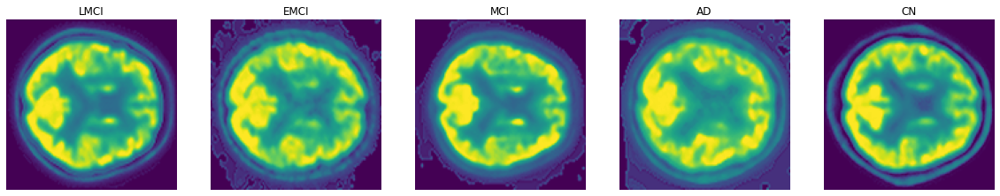

In [ ]:
from skimage.io import imread
from skimage.transform import resize
# Function to load and preprocess images
def load_images_from_folder(folder, img_size=(128, 128)):
    images = []
    for filename in os.listdir(folder):
        img = imread(os.path.join(folder, filename))
        if img is not None:
            img = resize(img, img_size)
            images.append(img)
    return np.array(images)

# Visualize some images from each subdirectory
img_size = (128, 128)  # Resize images for visualization
fig, axes = plt.subplots(1, len(subdirs), figsize=(20, 5))

for i, subdir in enumerate(subdirs):
    subdir_path = os.path.join(dataset_path, subdir)
    images = load_images_from_folder(subdir_path, img_size)
    axes[i].imshow(images[0])
    axes[i].set_title(subdir)
    axes[i].axis('off')

plt.show()


In [ ]:
# Function to load and preprocess all images
def load_all_images_with_labels(dataset_path, img_size=(128, 128)):
    data = []
    labels = []
    subdir_names = os.listdir(dataset_path)
    label_map = {subdir: i for i, subdir in enumerate(subdir_names)}
    reverse_label_map = {i: subdir for subdir, i in label_map.items()}

    for subdir in subdir_names:
        subdir_path = os.path.join(dataset_path, subdir)
        images = load_images_from_folder(subdir_path, img_size)
        data.append(images)
        labels.extend([label_map[subdir]] * len(images))

    data = np.vstack(data)
    labels = np.array(labels)
    return data, labels, reverse_label_map

# Load and preprocess all images
data, labels, reverse_label_map = load_all_images_with_labels(dataset_path, img_size)

# Check the shapes of the data and labels
print("Data shape:", data.shape)
print("Labels shape:", labels.shape)


Data shape: (250, 128, 128)
Labels shape: (250,)


Label distribution:
LMCI: 50 images
EMCI: 50 images
MCI: 50 images
AD: 50 images
CN: 50 images


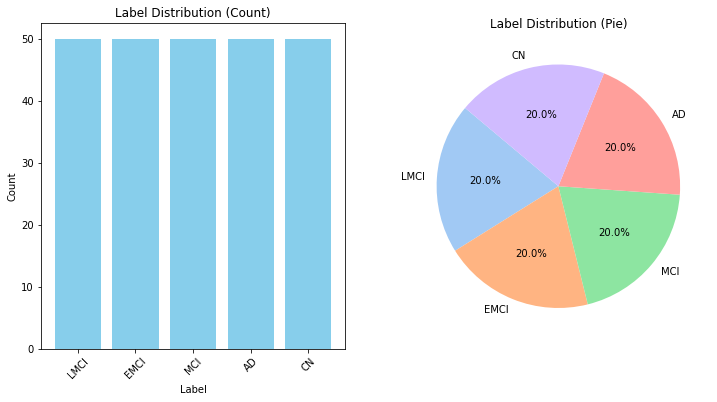

In [ ]:
import seaborn as sns
# Display the distribution of labels with subdirectory names
unique, counts = np.unique(labels, return_counts=True)
label_distribution = {reverse_label_map[label]: count for label, count in zip(unique, counts)}

print("Label distribution:")
for label, count in label_distribution.items():
    print(f"{label}: {count} images")

# Plot the label distribution with subdirectory names
plt.figure(figsize=(12, 6))

# Bar plot
plt.subplot(1, 2, 1)
plt.bar(label_distribution.keys(), label_distribution.values(), color='skyblue')
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Label Distribution (Count)')
plt.xticks(rotation=45)

# Pie chart
plt.subplot(1, 2, 2)
plt.pie(label_distribution.values(), labels=label_distribution.keys(), autopct='%1.1f%%', startangle=140, colors=sns.color_palette("pastel"))
plt.title('Label Distribution (Pie)')

plt.show()


In [ ]:
import numpy as np
from PIL import Image
import os
import time

def get_data_from_dirs(root_path, subdirs, dim=(128, 128), rand_shuffle=True):
    start = time.time()
    imgs_data = []

    for subdir in subdirs:
        subdir_path = os.path.join(root_path, subdir)
        if not os.path.exists(subdir_path):
            print(f"Directory {subdir_path} does not exist.")
            continue

        for img_name in os.listdir(subdir_path):
            img_path = os.path.join(subdir_path, img_name)
            img = Image.open(img_path).convert('RGB').resize(dim, Image.ANTIALIAS)  # Convert to RGB
            img_array = np.array(img)

            imgs_data.append(img_array)

    imgs_data = np.array(imgs_data).astype('float32') / 255.0  # Normalize to [0, 1]

    if rand_shuffle:
        np.random.shuffle(imgs_data)

    print(f"Data loading completed in {time.time() - start:.2f} seconds.")
    return imgs_data

# Define root path and subdirectories
path_root = '/kaggle/input/mni-alzheimer-data/process_data/'
subdirs = ['LMCI', 'EMCI', 'MCI', 'AD', 'CN']

# Load data
data_images = get_data_from_dirs(path_root, subdirs)
print(f"Total images loaded: {data_images.shape[0]}")


Data loading completed in 2.83 seconds.
Total images loaded: 250


## Compute the time

In [ ]:
# Time
def _time(start, end):
    # if in seconds
    if (end-start)<60:
        wall_time = f'{round((end-start),2)}sec'
    # if in minute(s)
    elif (end-start)>=3600:
        wall_time = f'{int((end-start)/3600)}h {int(((end-start)%3600)/60)}min {round((end-start)%60,2)}sec'
    # if in houre(s)
    else:
        wall_time = f'{int((end-start)/60)}min {round((end-start)%60,2)}sec'
    return wall_time

## Take a quick look at of the images

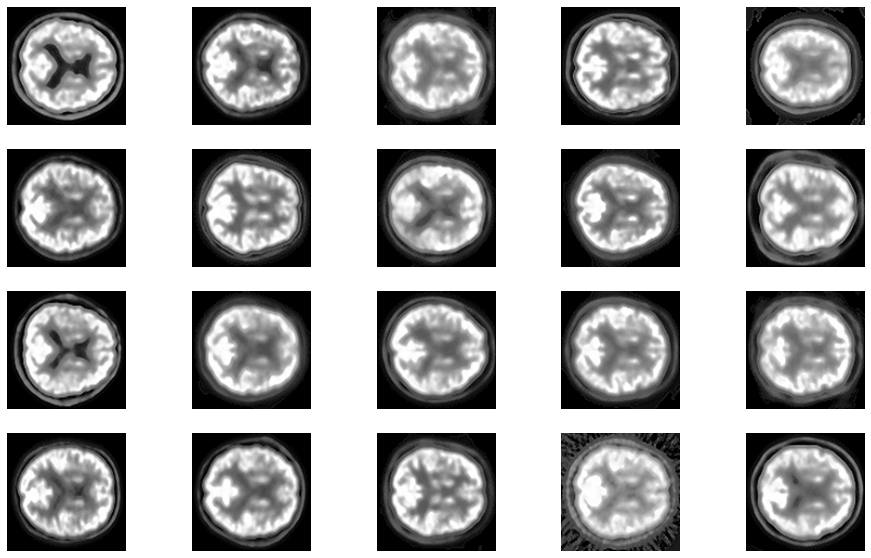

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def display_images(image_arrays, nrows=4, ncols=5, image_size=(128, 128)):
    plt.figure(figsize=(16, 10))

    # Ensure the number of images doesn't exceed nrows * ncols
    num_images = min(nrows * ncols, len(image_arrays))

    for idx in range(num_images):
        plt.subplot(nrows, ncols, idx + 1)
        img = image_arrays[idx]

        # Resize if necessary
        if img.shape[:2] != image_size:
            img = np.array(Image.fromarray(img).resize(image_size, Image.ANTIALIAS))

        plt.imshow(img)
        plt.axis('off')

    plt.show()

# Example usage:
# Assuming image_arrays is a list or array of image arrays
display_images(data_images)


## Get data

Data loading completed in 0.87 seconds.
Total images loaded: 250
The grid was created in 0.00 seconds


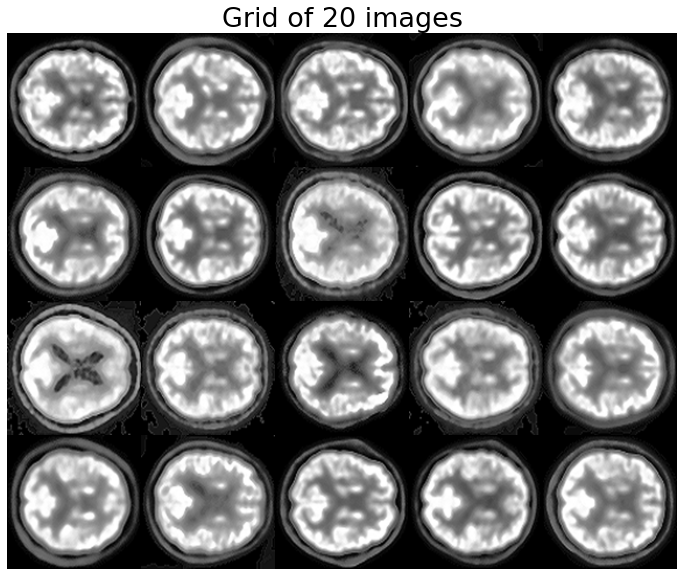

In [ ]:
def define_grid(data_images, nrows=4, ncols=5, plot_grid=True):
    # Save the start time
    start = time.time()

    # Determine the number of images to include in the grid
    num_images = min(nrows * ncols, data_images.shape[0])
    data_images = data_images[:num_images]

    # Initialize the grid with zeros (assuming images are 128x128)
    grid_height = nrows * data_images.shape[1]
    grid_width = ncols * data_images.shape[2]
    grid_channels = data_images.shape[3]
    grid_images = np.zeros((grid_height, grid_width, grid_channels))

    for idx, img in enumerate(data_images):
        row = idx // ncols
        col = idx % ncols
        grid_images[row * 128:(row + 1) * 128, col * 128:(col + 1) * 128] = img

    print(f'The grid was created in {time.time() - start:.2f} seconds')

    # Show the output grid
    if plot_grid:
        plt.figure(figsize=(12, 12))
        plt.axis("off")
        plt.title(f'Grid of {nrows * ncols} images', fontsize=27)
        if grid_channels == 1:
            plt.imshow(grid_images[:, :, 0], cmap='gray')
        else:
            plt.imshow(grid_images)
        plt.show()

    return grid_images

# Define root path and subdirectories
path_root = '/kaggle/input/mni-alzheimer-data/process_data/'
subdirs = ['LMCI', 'EMCI', 'MCI', 'AD', 'CN']

# Load data
data_images = get_data_from_dirs(path_root, subdirs)
print(f"Total images loaded: {data_images.shape[0]}")

# Define the grid and display images
grid_images = define_grid(data_images, nrows=4, ncols=5, plot_grid=True)

In [ ]:
# Display the size and shape of the images
print(f"Total number of images loaded: {data_images.shape[0]}")
print(f"Shape of the images: {data_images.shape[1:]}")  # Shape of a single image


Total number of images loaded: 250
Shape of the images: (128, 128, 3)


## Set the parameters  

In [ ]:
# Hyperparameters
n_epoch = 500
batch_size = 64
latent_dim = 100
cols, rows = 128, 128
channels = 3
dim = (cols, rows)
in_shape = (cols, rows, channels)
lr = 0.0002
beta1 = 0.5
nrows, ncols = 3, 4

# Discriminator

In [ ]:
from tensorflow.keras import models, layers, optimizers

def define_discriminator(in_shape=(128,128,3)):
    model = models.Sequential()
    model.add(layers.Conv2D(128, (5,5), padding='same', input_shape=in_shape))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.4))
    model.add(layers.Dense(1, activation='sigmoid'))
    opt = optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['mse'])
    return model


## Generator

In [ ]:
def define_generator(latent_dim):
    model = models.Sequential()
    n_nodes = 128*8*8
    model.add(layers.Dense(n_nodes, input_dim=latent_dim))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Reshape((8, 8, 128)))
    model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Conv2D(3, (5,5), activation='tanh', padding='same'))
    return model

In [ ]:
# Generate Latent Points
def generate_latent_points(latent_dim, n_samples):
    x_input = np.random.randn(latent_dim * n_samples)
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input

# Generate Fake Samples
def generate_fake_samples(g_model, latent_dim, n_samples):
    x_input = generate_latent_points(latent_dim, n_samples)
    X = g_model.predict(x_input)
    y = np.zeros((n_samples, 1))
    return X, y

## Define GAN model

In [ ]:
def define_gan(g_model, d_model):
    # Make the discriminator's weights non-trainable
    d_model.trainable = False

    # Define the GAN model
    model = models.Sequential()
    model.add(g_model)  # Add generator
    model.add(d_model)  # Add discriminator

    # Compile the GAN model
    opt = optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model


# Retrieve Real Samples
def get_real_samples(dataset, n_samples):
    ix = np.random.randint(0, dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones((n_samples, 1))
    return X, y

# Save Plot of Generated Images
def show_generated(generated, epoch, nrows=4, ncols=5):
    plt.figure(figsize=(10,10))
    for idx in range(nrows * ncols):
        plt.subplot(nrows, ncols, idx + 1)
        plt.imshow((generated[idx] + 1) / 2)
        plt.axis('off')
    plt.savefig(f'image_at_epoch_{epoch + 1:04d}.png')
    plt.show()

# Evaluate the Discriminator and Plot Generated Images
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=100):
    X_real, y_real = get_real_samples(dataset, n_samples)
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    print(f'> Accuracy at epoch {epoch + 1} [real: {acc_real * 100:.0f}%, fake: {acc_fake * 100:.0f}%]')
    show_generated(x_fake, epoch)

# Plot Loss
def plot_loss(loss):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training", fontsize=20)
    plt.plot(loss[0], label="D_real")
    plt.plot(loss[1], label="D_fake")
    plt.plot(loss[2], label="G")
    plt.xlabel("Iteration", fontsize=20)
    plt.ylabel("Loss", fontsize=20)
    plt.legend()
    plt.show()

# Time Formatting Function
def _time(start, end):
    hours, rem = divmod(end - start, 3600)
    minutes, seconds = divmod(rem, 60)
    return "{:0>2}:{:0>2}:{:05.2f}".format(int(hours), int(minutes), seconds)

# Train the models

In [ ]:
def train(g_model, d_model, gan_model, dataset, latent_dim=100, n_epochs=500, n_batch=128):
    start = time.time()
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    loss1, loss2, loss3 = [], [], []

    print('Training Start...')
    for i in range(n_epochs):
        start1 = time.time()
        for j in range(bat_per_epo):
            X_real, y_real = get_real_samples(dataset, half_batch)
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            X_gan = generate_latent_points(latent_dim, n_batch)
            y_gan = np.ones((n_batch, 1))
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            loss1.append(d_loss1)
            loss2.append(d_loss2)
            loss3.append(g_loss)

        print(f'Epoch: {i+1}/{n_epochs}, Loss: [D_real = {d_loss1:.3f}, D_fake = {d_loss2:.3f}, G = {g_loss:.3f}], time: {time.time() - start1:.2f} sec')

        if (i+1) % (n_epochs // 10) == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)

    print(f'Total time for training {n_epochs} epochs is {time.time() - start:.2f} sec')
    plot_loss((loss1, loss2, loss3))


In [ ]:
# Initialize models
discriminator = define_discriminator()
generator = define_generator(latent_dim)
gan = define_gan(generator, discriminator)

In [ ]:
discriminator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 128)     9728      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 128, 128)     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 128)       409728    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       409728    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 128)       4

In [ ]:
generator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 8192)              827392    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 8192)              0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 128)       262272    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 32, 32, 128)       262272    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 32, 32, 128)      

In [ ]:
gan.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 128, 128, 3)       1886083   
_________________________________________________________________
sequential (Sequential)      (None, 1)                 1656833   
Total params: 3,542,916
Trainable params: 1,886,083
Non-trainable params: 1,656,833
_________________________________________________________________


Training Start...
Epoch: 1/500, Loss: [D_real = 0.026, D_fake = 0.714, G = 0.682], time: 7.33 sec
Epoch: 2/500, Loss: [D_real = 0.007, D_fake = 0.758, G = 0.679], time: 1.40 sec
Epoch: 3/500, Loss: [D_real = 0.139, D_fake = 0.894, G = 0.671], time: 1.40 sec
Epoch: 4/500, Loss: [D_real = 0.019, D_fake = 0.535, G = 1.199], time: 1.40 sec
Epoch: 5/500, Loss: [D_real = 0.000, D_fake = 0.662, G = 0.764], time: 1.40 sec
Epoch: 6/500, Loss: [D_real = 0.143, D_fake = 0.587, G = 0.807], time: 1.41 sec
Epoch: 7/500, Loss: [D_real = 0.000, D_fake = 0.264, G = 2.487], time: 1.41 sec
Epoch: 8/500, Loss: [D_real = 0.003, D_fake = 0.004, G = 5.875], time: 1.40 sec
Epoch: 9/500, Loss: [D_real = 0.000, D_fake = 0.011, G = 9.429], time: 1.41 sec
Epoch: 10/500, Loss: [D_real = 0.000, D_fake = 0.504, G = 1.341], time: 1.40 sec
Epoch: 11/500, Loss: [D_real = 0.009, D_fake = 0.009, G = 5.128], time: 1.40 sec
Epoch: 12/500, Loss: [D_real = 0.000, D_fake = 0.013, G = 4.977], time: 1.40 sec
Epoch: 13/500, Loss

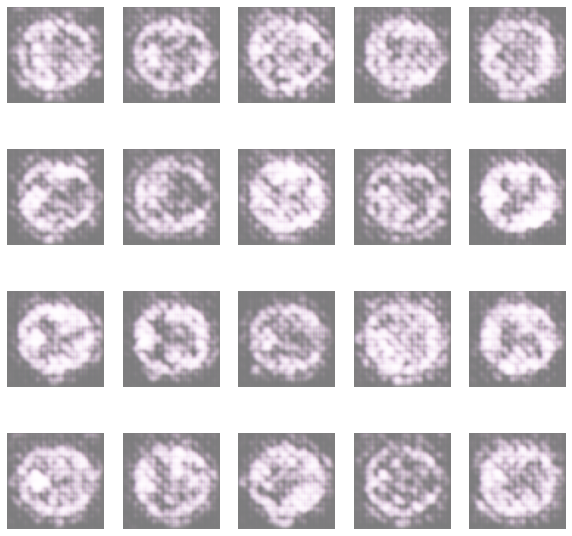

Epoch: 51/500, Loss: [D_real = 0.402, D_fake = 0.135, G = 2.985], time: 1.40 sec
Epoch: 52/500, Loss: [D_real = 0.204, D_fake = 0.504, G = 4.832], time: 1.40 sec
Epoch: 53/500, Loss: [D_real = 0.610, D_fake = 0.295, G = 3.876], time: 1.40 sec
Epoch: 54/500, Loss: [D_real = 0.380, D_fake = 0.328, G = 3.178], time: 1.41 sec
Epoch: 55/500, Loss: [D_real = 0.372, D_fake = 0.322, G = 3.968], time: 1.40 sec
Epoch: 56/500, Loss: [D_real = 0.361, D_fake = 0.374, G = 3.081], time: 1.40 sec
Epoch: 57/500, Loss: [D_real = 1.240, D_fake = 0.771, G = 2.018], time: 1.41 sec
Epoch: 58/500, Loss: [D_real = 0.557, D_fake = 0.359, G = 2.820], time: 1.40 sec
Epoch: 59/500, Loss: [D_real = 0.293, D_fake = 0.390, G = 2.155], time: 1.40 sec
Epoch: 60/500, Loss: [D_real = 0.565, D_fake = 0.496, G = 2.391], time: 1.40 sec
Epoch: 61/500, Loss: [D_real = 0.596, D_fake = 0.678, G = 2.671], time: 1.41 sec
Epoch: 62/500, Loss: [D_real = 0.646, D_fake = 0.462, G = 2.528], time: 1.40 sec
Epoch: 63/500, Loss: [D_real

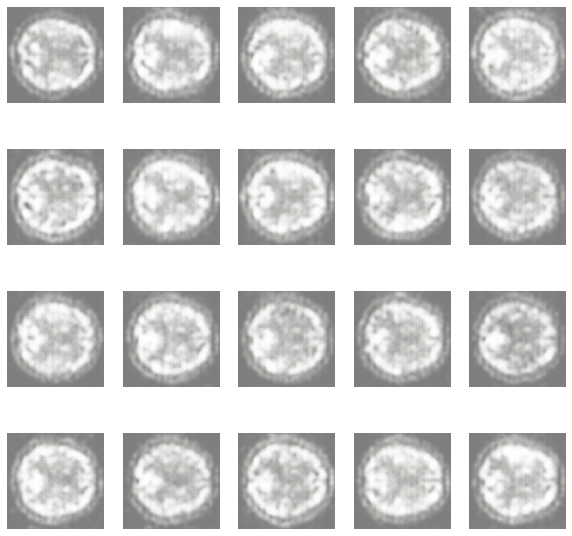

Epoch: 101/500, Loss: [D_real = 0.364, D_fake = 0.249, G = 2.338], time: 1.41 sec
Epoch: 102/500, Loss: [D_real = 0.333, D_fake = 0.386, G = 2.502], time: 1.40 sec
Epoch: 103/500, Loss: [D_real = 0.438, D_fake = 0.375, G = 2.328], time: 1.40 sec
Epoch: 104/500, Loss: [D_real = 0.634, D_fake = 0.402, G = 2.175], time: 1.41 sec
Epoch: 105/500, Loss: [D_real = 0.479, D_fake = 0.455, G = 2.646], time: 1.40 sec
Epoch: 106/500, Loss: [D_real = 0.575, D_fake = 0.447, G = 2.155], time: 1.40 sec
Epoch: 107/500, Loss: [D_real = 0.593, D_fake = 0.275, G = 2.046], time: 1.41 sec
Epoch: 108/500, Loss: [D_real = 0.516, D_fake = 0.327, G = 2.220], time: 1.41 sec
Epoch: 109/500, Loss: [D_real = 0.280, D_fake = 0.183, G = 2.683], time: 1.40 sec
Epoch: 110/500, Loss: [D_real = 0.307, D_fake = 0.247, G = 2.992], time: 1.39 sec
Epoch: 111/500, Loss: [D_real = 0.513, D_fake = 0.540, G = 2.894], time: 1.40 sec
Epoch: 112/500, Loss: [D_real = 0.500, D_fake = 0.399, G = 2.332], time: 1.39 sec
Epoch: 113/500, 

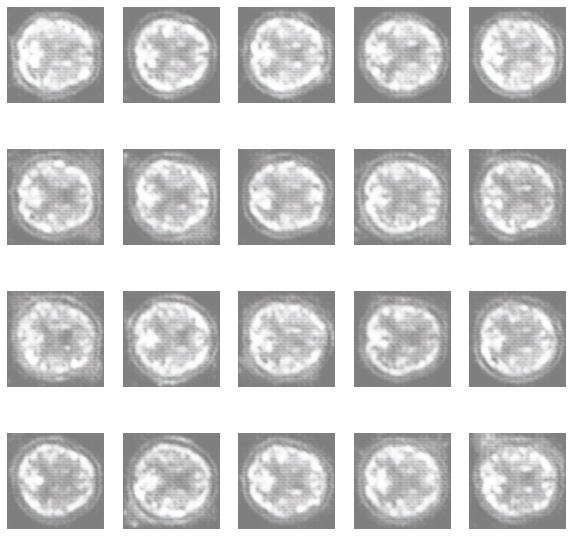

Epoch: 151/500, Loss: [D_real = 0.685, D_fake = 0.555, G = 2.722], time: 1.40 sec
Epoch: 152/500, Loss: [D_real = 0.356, D_fake = 0.489, G = 2.939], time: 1.40 sec
Epoch: 153/500, Loss: [D_real = 0.370, D_fake = 0.451, G = 3.597], time: 1.40 sec
Epoch: 154/500, Loss: [D_real = 0.302, D_fake = 0.362, G = 3.147], time: 1.41 sec
Epoch: 155/500, Loss: [D_real = 0.477, D_fake = 0.830, G = 4.141], time: 1.40 sec
Epoch: 156/500, Loss: [D_real = 0.497, D_fake = 0.314, G = 2.721], time: 1.40 sec
Epoch: 157/500, Loss: [D_real = 0.886, D_fake = 1.031, G = 2.505], time: 1.40 sec
Epoch: 158/500, Loss: [D_real = 0.410, D_fake = 0.325, G = 2.597], time: 1.40 sec
Epoch: 159/500, Loss: [D_real = 0.244, D_fake = 0.335, G = 2.213], time: 1.40 sec
Epoch: 160/500, Loss: [D_real = 0.314, D_fake = 0.332, G = 2.474], time: 1.40 sec
Epoch: 161/500, Loss: [D_real = 0.288, D_fake = 0.354, G = 2.615], time: 1.64 sec
Epoch: 162/500, Loss: [D_real = 0.732, D_fake = 0.924, G = 2.987], time: 1.40 sec
Epoch: 163/500, 

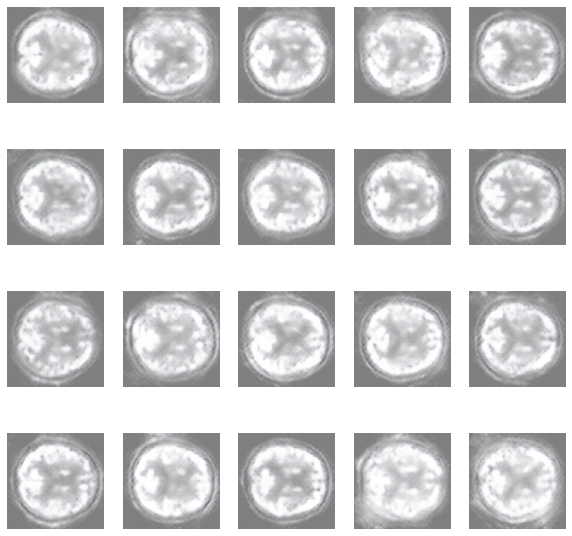

Epoch: 201/500, Loss: [D_real = 0.510, D_fake = 0.621, G = 2.205], time: 1.40 sec
Epoch: 202/500, Loss: [D_real = 0.245, D_fake = 0.279, G = 2.924], time: 1.40 sec
Epoch: 203/500, Loss: [D_real = 0.465, D_fake = 0.657, G = 2.391], time: 1.41 sec
Epoch: 204/500, Loss: [D_real = 0.371, D_fake = 0.349, G = 2.834], time: 1.40 sec
Epoch: 205/500, Loss: [D_real = 0.410, D_fake = 0.469, G = 2.403], time: 1.39 sec
Epoch: 206/500, Loss: [D_real = 0.591, D_fake = 0.374, G = 2.093], time: 1.39 sec
Epoch: 207/500, Loss: [D_real = 0.418, D_fake = 0.425, G = 2.653], time: 1.39 sec
Epoch: 208/500, Loss: [D_real = 0.567, D_fake = 0.554, G = 2.149], time: 1.40 sec
Epoch: 209/500, Loss: [D_real = 0.515, D_fake = 0.666, G = 2.417], time: 1.40 sec
Epoch: 210/500, Loss: [D_real = 0.480, D_fake = 0.388, G = 2.424], time: 1.40 sec
Epoch: 211/500, Loss: [D_real = 0.541, D_fake = 0.657, G = 2.206], time: 1.40 sec
Epoch: 212/500, Loss: [D_real = 0.527, D_fake = 0.588, G = 2.741], time: 1.40 sec
Epoch: 213/500, 

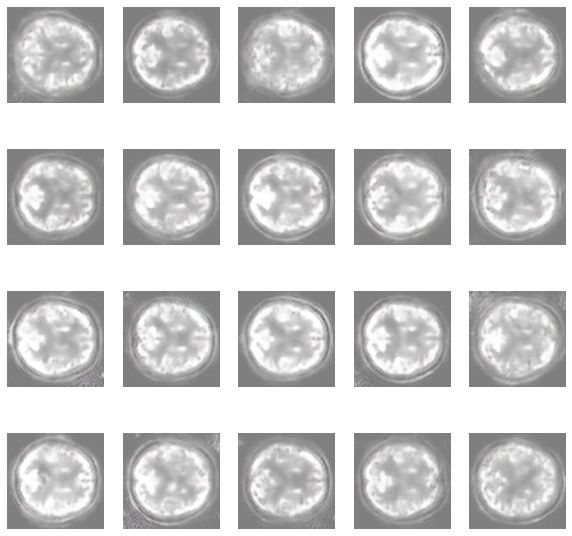

Epoch: 251/500, Loss: [D_real = 0.533, D_fake = 0.602, G = 1.583], time: 1.40 sec
Epoch: 252/500, Loss: [D_real = 0.598, D_fake = 0.680, G = 1.531], time: 1.40 sec
Epoch: 253/500, Loss: [D_real = 0.655, D_fake = 0.672, G = 1.504], time: 1.39 sec
Epoch: 254/500, Loss: [D_real = 0.586, D_fake = 0.683, G = 1.618], time: 1.40 sec
Epoch: 255/500, Loss: [D_real = 0.464, D_fake = 0.558, G = 1.708], time: 1.40 sec
Epoch: 256/500, Loss: [D_real = 0.609, D_fake = 0.586, G = 1.766], time: 1.40 sec
Epoch: 257/500, Loss: [D_real = 0.712, D_fake = 0.578, G = 1.744], time: 1.41 sec
Epoch: 258/500, Loss: [D_real = 0.478, D_fake = 0.466, G = 1.745], time: 1.41 sec
Epoch: 259/500, Loss: [D_real = 0.675, D_fake = 0.672, G = 1.774], time: 1.40 sec
Epoch: 260/500, Loss: [D_real = 0.705, D_fake = 0.563, G = 1.636], time: 1.40 sec
Epoch: 261/500, Loss: [D_real = 0.493, D_fake = 0.727, G = 1.640], time: 1.41 sec
Epoch: 262/500, Loss: [D_real = 0.488, D_fake = 0.592, G = 1.728], time: 1.40 sec
Epoch: 263/500, 

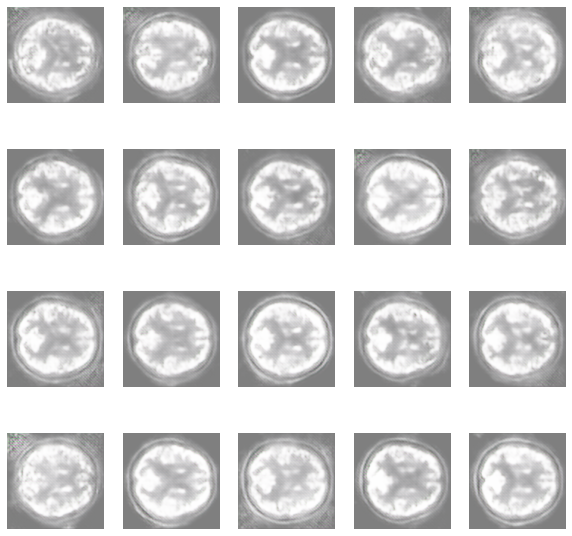

Epoch: 301/500, Loss: [D_real = 0.513, D_fake = 0.639, G = 1.817], time: 1.39 sec
Epoch: 302/500, Loss: [D_real = 0.556, D_fake = 0.626, G = 1.745], time: 1.39 sec
Epoch: 303/500, Loss: [D_real = 0.686, D_fake = 0.445, G = 1.825], time: 1.39 sec
Epoch: 304/500, Loss: [D_real = 0.458, D_fake = 0.497, G = 1.975], time: 1.40 sec
Epoch: 305/500, Loss: [D_real = 0.513, D_fake = 0.497, G = 1.540], time: 1.39 sec
Epoch: 306/500, Loss: [D_real = 0.453, D_fake = 0.489, G = 1.847], time: 1.40 sec
Epoch: 307/500, Loss: [D_real = 0.463, D_fake = 0.662, G = 2.214], time: 1.40 sec
Epoch: 308/500, Loss: [D_real = 0.556, D_fake = 0.544, G = 1.941], time: 1.40 sec
Epoch: 309/500, Loss: [D_real = 0.391, D_fake = 0.453, G = 2.045], time: 1.40 sec
Epoch: 310/500, Loss: [D_real = 0.599, D_fake = 0.679, G = 1.815], time: 1.40 sec
Epoch: 311/500, Loss: [D_real = 0.395, D_fake = 0.528, G = 1.988], time: 1.40 sec
Epoch: 312/500, Loss: [D_real = 0.582, D_fake = 0.614, G = 1.915], time: 1.40 sec
Epoch: 313/500, 

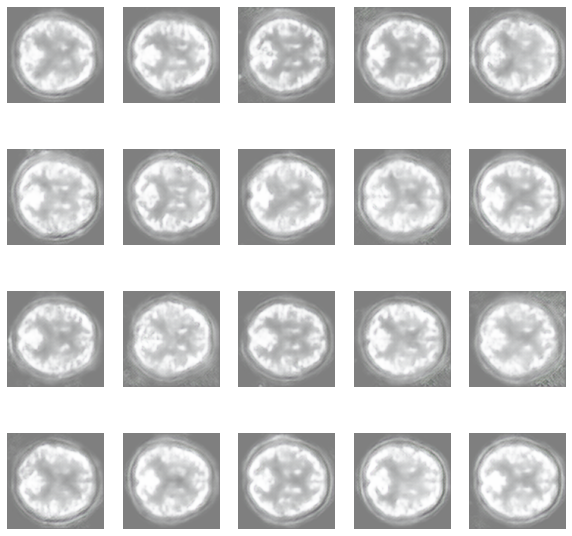

Epoch: 351/500, Loss: [D_real = 0.530, D_fake = 0.570, G = 1.957], time: 1.40 sec
Epoch: 352/500, Loss: [D_real = 0.408, D_fake = 0.533, G = 2.380], time: 1.39 sec
Epoch: 353/500, Loss: [D_real = 0.471, D_fake = 0.671, G = 2.540], time: 1.40 sec
Epoch: 354/500, Loss: [D_real = 0.608, D_fake = 0.555, G = 2.190], time: 1.42 sec
Epoch: 355/500, Loss: [D_real = 0.645, D_fake = 0.493, G = 2.156], time: 1.40 sec
Epoch: 356/500, Loss: [D_real = 0.667, D_fake = 0.521, G = 1.958], time: 1.42 sec
Epoch: 357/500, Loss: [D_real = 0.419, D_fake = 0.586, G = 2.212], time: 1.41 sec
Epoch: 358/500, Loss: [D_real = 0.519, D_fake = 0.288, G = 2.145], time: 1.41 sec
Epoch: 359/500, Loss: [D_real = 0.499, D_fake = 0.460, G = 2.265], time: 1.40 sec
Epoch: 360/500, Loss: [D_real = 0.299, D_fake = 0.249, G = 2.570], time: 1.40 sec
Epoch: 361/500, Loss: [D_real = 0.495, D_fake = 0.449, G = 2.148], time: 1.39 sec
Epoch: 362/500, Loss: [D_real = 0.622, D_fake = 0.773, G = 2.146], time: 1.39 sec
Epoch: 363/500, 

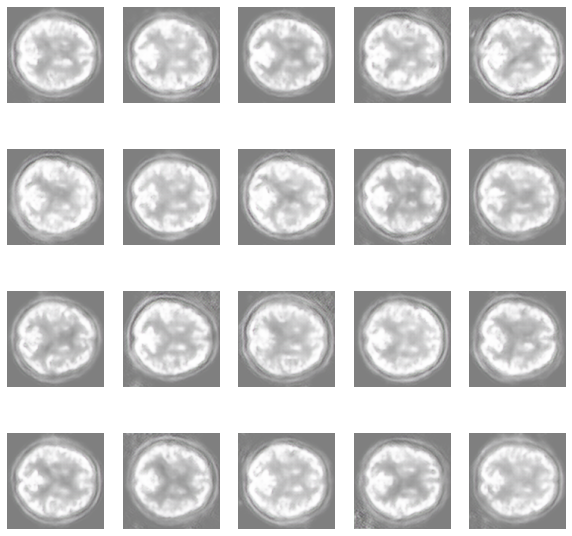

Epoch: 401/500, Loss: [D_real = 0.448, D_fake = 0.652, G = 2.601], time: 1.41 sec
Epoch: 402/500, Loss: [D_real = 0.418, D_fake = 0.484, G = 2.715], time: 1.40 sec
Epoch: 403/500, Loss: [D_real = 0.521, D_fake = 0.677, G = 2.423], time: 1.40 sec
Epoch: 404/500, Loss: [D_real = 0.364, D_fake = 0.580, G = 2.679], time: 1.41 sec
Epoch: 405/500, Loss: [D_real = 0.491, D_fake = 0.366, G = 2.192], time: 1.40 sec
Epoch: 406/500, Loss: [D_real = 0.516, D_fake = 0.546, G = 2.212], time: 1.40 sec
Epoch: 407/500, Loss: [D_real = 0.347, D_fake = 0.529, G = 2.555], time: 1.41 sec
Epoch: 408/500, Loss: [D_real = 0.391, D_fake = 0.465, G = 2.334], time: 1.40 sec
Epoch: 409/500, Loss: [D_real = 0.360, D_fake = 0.331, G = 2.468], time: 1.39 sec
Epoch: 410/500, Loss: [D_real = 0.442, D_fake = 0.316, G = 2.614], time: 1.39 sec
Epoch: 411/500, Loss: [D_real = 0.410, D_fake = 0.286, G = 2.670], time: 1.40 sec
Epoch: 412/500, Loss: [D_real = 0.433, D_fake = 0.567, G = 2.804], time: 1.40 sec
Epoch: 413/500, 

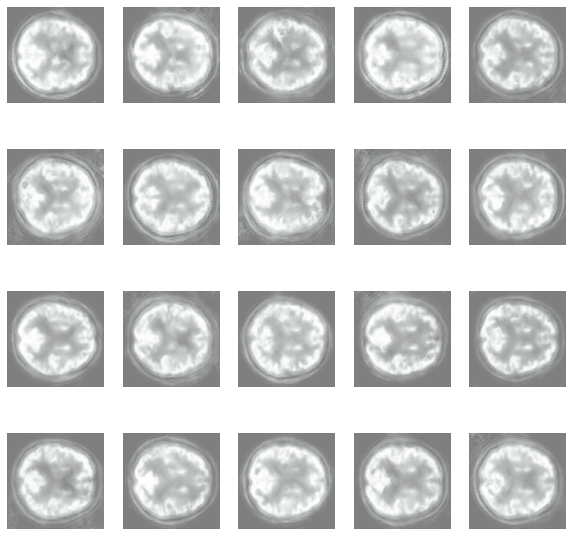

Epoch: 451/500, Loss: [D_real = 0.480, D_fake = 0.451, G = 2.514], time: 1.40 sec
Epoch: 452/500, Loss: [D_real = 0.375, D_fake = 0.386, G = 2.685], time: 1.40 sec
Epoch: 453/500, Loss: [D_real = 0.379, D_fake = 0.681, G = 3.142], time: 1.40 sec
Epoch: 454/500, Loss: [D_real = 0.533, D_fake = 0.581, G = 2.606], time: 1.40 sec
Epoch: 455/500, Loss: [D_real = 0.346, D_fake = 0.516, G = 3.491], time: 1.39 sec
Epoch: 456/500, Loss: [D_real = 0.499, D_fake = 0.322, G = 2.587], time: 1.40 sec
Epoch: 457/500, Loss: [D_real = 0.283, D_fake = 0.325, G = 2.676], time: 1.41 sec
Epoch: 458/500, Loss: [D_real = 0.599, D_fake = 0.476, G = 2.757], time: 1.40 sec
Epoch: 459/500, Loss: [D_real = 0.322, D_fake = 0.242, G = 2.498], time: 1.40 sec
Epoch: 460/500, Loss: [D_real = 0.486, D_fake = 0.582, G = 2.941], time: 1.40 sec
Epoch: 461/500, Loss: [D_real = 0.548, D_fake = 0.564, G = 2.717], time: 1.40 sec
Epoch: 462/500, Loss: [D_real = 0.348, D_fake = 0.373, G = 2.625], time: 1.40 sec
Epoch: 463/500, 

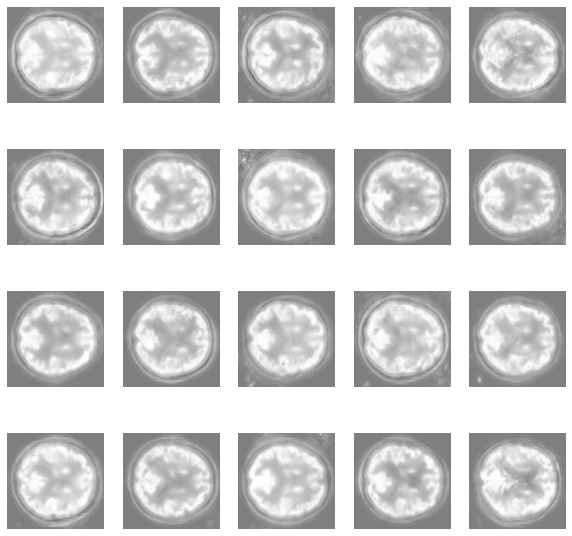

Total time for training 500 epochs is 721.79 sec


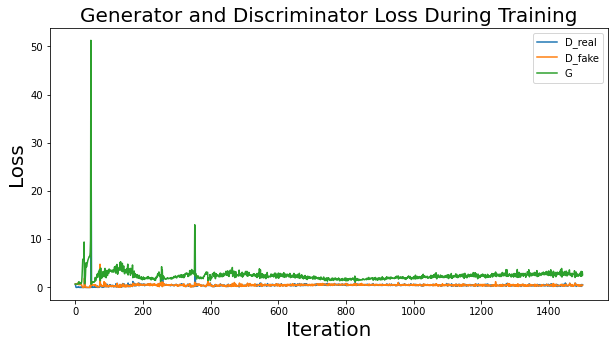

In [ ]:
# train model
history = train(generator, discriminator, gan, data_images, latent_dim, n_epochs=n_epoch, n_batch=batch_size)

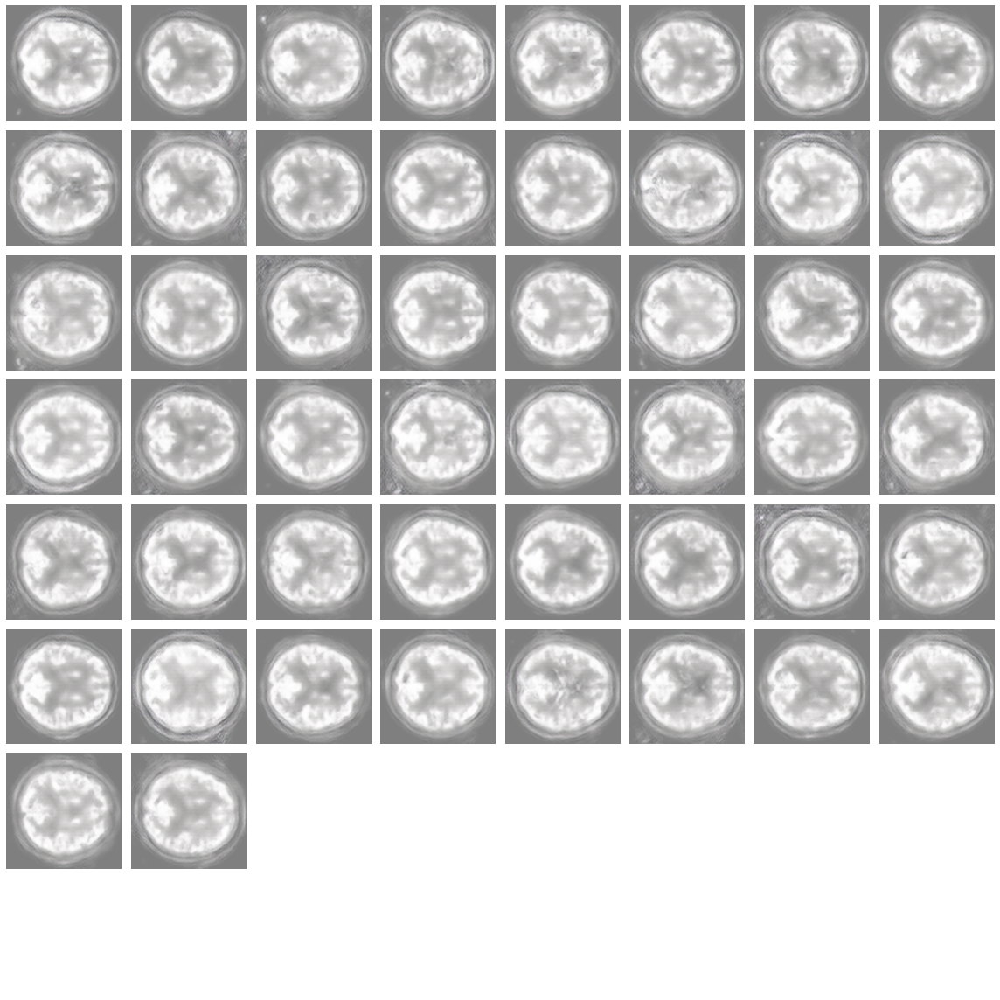

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_generated_images(generator, latent_dim, n_samples=10, grid_size=None):
    # Generate images
    noise = np.random.randn(n_samples, latent_dim)
    generated_images = generator.predict(noise)

    # Scale images to [0, 1]
    generated_images = (generated_images + 1) / 2.0

    # Determine grid size
    if grid_size is None:
        grid_size = int(np.ceil(np.sqrt(n_samples)))

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(grid_size * 2, grid_size * 2))
    axes = axes.flatten()

    for i in range(grid_size * grid_size):
        if i < n_samples:
            axes[i].imshow(generated_images[i])
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Plot some generated images in a grid
plot_generated_images(generator, latent_dim=100, n_samples=50)


In [ ]:
from skimage.metrics import structural_similarity as ssim
import numpy as np
def calculate_ssim_mse(real_images, fake_images):
    ssim_scores = []
    mse_scores = []

    for real_img, fake_img in zip(real_images, fake_images):
        # Convert images to grayscale if they are not already
        if len(real_img.shape) == 3 and real_img.shape[2] == 3:
            real_img = np.mean(real_img, axis=-1)
            fake_img = np.mean(fake_img, axis=-1)

        # Compute SSIM and MSE
        ssim_score, _ = ssim(real_img, fake_img, full=True)
        mse_score = np.mean((real_img - fake_img) ** 2)

        ssim_scores.append(ssim_score)
        mse_scores.append(mse_score)

    return np.mean(ssim_scores), np.mean(mse_scores)


In [ ]:
def evaluate_discriminator(d_model, generator, dataset, latent_dim, n_samples=100):
    X_real, y_real = get_real_samples(dataset, n_samples)
    X_fake, y_fake = generate_fake_samples(generator, latent_dim, n_samples)

    d_loss_real, _ = d_model.evaluate(X_real, y_real, verbose=0)
    d_loss_fake, _ = d_model.evaluate(X_fake, y_fake, verbose=0)

    print(f'Discriminator Loss on Real Images: {d_loss_real:.3f}')
    print(f'Discriminator Loss on Fake Images: {d_loss_fake:.3f}')

    # Calculate SSIM and MSE
    ssim_score, mse_score = calculate_ssim_mse(X_real, X_fake)
    print(f'Mean SSIM: {ssim_score:.3f}')
    print(f'Mean MSE: {mse_score:.3f}')

# Evaluate the discriminator
evaluate_discriminator(discriminator, generator, data_images, latent_dim=100, n_samples=100)


Discriminator Loss on Real Images: 0.436
Discriminator Loss on Fake Images: 0.198
Mean SSIM: 0.588
Mean MSE: 0.018


# **SRGAN**

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Add, LeakyReLU, BatchNormalization, UpSampling2D, Flatten, Concatenate, Dense, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, LeakyReLU, Add

def residual_block(x_in):
    x = Conv2D(64, kernel_size=3, padding='same')(x_in)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(64, kernel_size=3, padding='same')(x)
    x = BatchNormalization()(x)

    x = Add()([x, x_in])
    return x


In [ ]:
from tensorflow.keras.layers import Dense, Reshape, UpSampling2D, Conv2D, BatchNormalization, LeakyReLU
from tensorflow.keras.models import Model

def build_generator(latent_dim=100):
    inputs = Input(shape=(latent_dim,))
    x = Dense(16 * 16 * 128)(inputs)  # Adjust to match your architecture
    x = LeakyReLU(alpha=0.2)(x)
    x = Reshape((16, 16, 128))(x)  # Make sure this matches the dimensions

    x = UpSampling2D()(x)
    x = Conv2D(128, kernel_size=3, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = UpSampling2D()(x)
    x = Conv2D(64, kernel_size=3, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = UpSampling2D()(x)
    x = Conv2D(32, kernel_size=3, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(3, kernel_size=3, padding='same', activation='tanh')(x)

    model = Model(inputs, x)
    return model


In [ ]:
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_discriminator(input_shape=(128, 128, 3)):
    inputs = Input(shape=input_shape)
    x = Conv2D(64, kernel_size=3, padding='same')(inputs)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv2D(128, kernel_size=3, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Flatten()(x)
    x = Dense(1, activation='sigmoid')(x)  # Output a single probability

    model = Model(inputs, x)
    model.compile(loss='binary_crossentropy', optimizer=Adam())
    return model


In [ ]:
from tensorflow.keras.models import Sequential

def build_gan(generator, discriminator):
    discriminator.trainable = False
    gan = Sequential()
    gan.add(generator)
    gan.add(discriminator)
    gan.compile(optimizer=Adam(), loss='binary_crossentropy')
    return gan


In [ ]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
import tensorflow as tf

def build_vgg19():
    vgg19 = VGG19(include_top=False, weights='imagenet', input_shape=(128, 128, 3))
    model = Model(inputs=vgg19.input, outputs=vgg19.get_layer('block5_conv4').output)
    model.trainable = False
    return model

def perceptual_loss(y_true, y_pred):
    vgg19 = build_vgg19()
    y_true_features = vgg19(y_true)
    y_pred_features = vgg19(y_pred)
    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [ ]:
from IPython.display import Image, display
def save_and_display_generated_images(epoch, generator, latent_dim=100, examples=10, dim=(1, 10), figsize=(10, 1)):
    noise = np.random.randn(examples, latent_dim)
    generated_images = generator.predict(noise)
    generated_images = (generated_images + 1) / 2.0  # Rescale to [0, 1]

    plt.figure(figsize=figsize)
    for i in range(examples):
        plt.subplot(dim[0], dim[1], i + 1)
        plt.imshow(generated_images[i])
        plt.axis('off')
    plt.tight_layout()
    file_name = f'gan_generated_image_epoch_{epoch}.png'
    plt.savefig(file_name)
    plt.close()

    display(Image(filename=file_name))


In [ ]:
import numpy as np
from skimage.metrics import structural_similarity as ssim
import tensorflow as tf

def train_sgan(generator, discriminator, gan, dataset, epochs=100, batch_size=64, latent_dim=100, save_interval=10):
    d_losses = []
    g_losses = []
    mse_losses = []
    ssim_losses = []
    for epoch in range(epochs):
        idx = np.random.randint(0, dataset.shape[0], batch_size)
        real_imgs = dataset[idx]
        real_labels = np.ones((batch_size, 1))  # Correct shape for real images

        # Generate fake samples
        noise = np.random.randn(batch_size, latent_dim)  # Ensure this matches the generator input shape
        fake_imgs = generator.predict(noise)
        fake_labels = np.zeros((batch_size, 1))  # Correct shape for fake images

        # Train Discriminator
        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        d_loss = (d_loss_real + d_loss_fake) / 2

        # Train Generator
        noise = np.random.randn(batch_size, latent_dim)  # Ensure this matches the generator input shape
        g_loss = gan.train_on_batch(noise, np.ones((batch_size, 1)))  # Use ones for generator

        # Calculate MSE and SSIM
        mse_loss = tf.reduce_mean(tf.square(real_imgs - fake_imgs))
        ssim_score = np.mean([ssim(real_imgs[i], fake_imgs[i], multichannel=True) for i in range(batch_size)])

        d_losses.append(d_loss)
        g_losses.append(g_loss)
        mse_losses.append(mse_loss)
        ssim_losses.append(ssim_score)

        if epoch % 10 == 0:  # Adjusted to show progress more frequently
            print(f'Epoch {epoch}/{epochs} - D Loss: {(d_loss_real + d_loss_fake) / 2:.4f} - G Loss: {g_loss:.4f} - MSE: {mse_loss:.4f} - SSIM: {ssim_score:.4f}')

        # Save and display generated images at specified intervals
        if epoch % save_interval == 0:
            save_and_display_generated_images(epoch, generator, latent_dim)

    return d_losses, g_losses, mse_losses, ssim_losses


In [ ]:
# Example usage
latent_dim = 100
img_shape = (128, 128, 3)

generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)

In [ ]:
generator.summary()

Model: "model_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_31 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
dense_19 (Dense)             (None, 32768)             3309568   
_________________________________________________________________
leaky_re_lu_105 (LeakyReLU)  (None, 32768)             0         
_________________________________________________________________
reshape_13 (Reshape)         (None, 16, 16, 128)       0         
_________________________________________________________________
up_sampling2d_31 (UpSampling (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_140 (Conv2D)          (None, 32, 32, 128)       147584    
_________________________________________________________________
batch_normalization_63 (Batc (None, 32, 32, 128)       512

In [ ]:
discriminator.summary()

Model: "model_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_32 (InputLayer)        [(None, 128, 128, 3)]     0         
_________________________________________________________________
conv2d_144 (Conv2D)          (None, 128, 128, 64)      1792      
_________________________________________________________________
leaky_re_lu_109 (LeakyReLU)  (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_145 (Conv2D)          (None, 128, 128, 128)     73856     
_________________________________________________________________
leaky_re_lu_110 (LeakyReLU)  (None, 128, 128, 128)     0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 2097152)           0         
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 209

In [ ]:
gan.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model_26 (Model)             (None, 128, 128, 3)       3551171   
_________________________________________________________________
model_27 (Model)             (None, 1)                 2172801   
Total params: 5,723,972
Trainable params: 3,550,723
Non-trainable params: 2,173,249
_________________________________________________________________


Epoch 0/500 - D Loss: 0.0028 - G Loss: 0.0272 - MSE: 0.0583 - SSIM: 0.3680


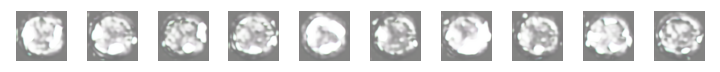

Epoch 10/500 - D Loss: 0.0044 - G Loss: 0.0120 - MSE: 0.0590 - SSIM: 0.3609


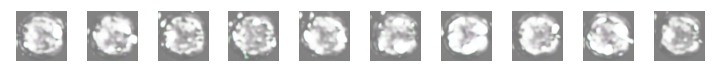

Epoch 20/500 - D Loss: 0.0089 - G Loss: 0.0153 - MSE: 0.0579 - SSIM: 0.3714


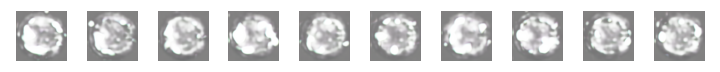

Epoch 30/500 - D Loss: 0.0056 - G Loss: 0.0031 - MSE: 0.0623 - SSIM: 0.3533


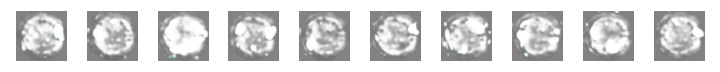

Epoch 40/500 - D Loss: 0.0045 - G Loss: 0.0003 - MSE: 0.0609 - SSIM: 0.3714


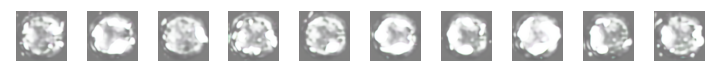

Epoch 50/500 - D Loss: 0.0003 - G Loss: 0.0000 - MSE: 0.0556 - SSIM: 0.3804


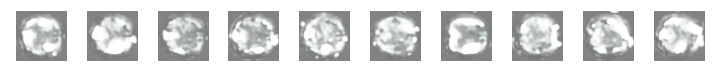

Epoch 60/500 - D Loss: 0.6379 - G Loss: 0.0050 - MSE: 0.0580 - SSIM: 0.3755


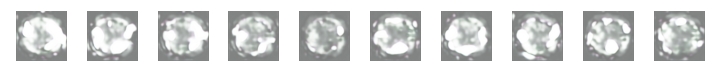

Epoch 70/500 - D Loss: 0.0004 - G Loss: 0.0003 - MSE: 0.0612 - SSIM: 0.3740


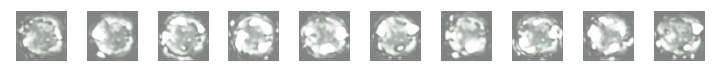

Epoch 80/500 - D Loss: 0.0020 - G Loss: 0.0000 - MSE: 0.0607 - SSIM: 0.4033


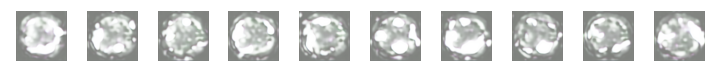

Epoch 90/500 - D Loss: 0.0095 - G Loss: 0.0000 - MSE: 0.0616 - SSIM: 0.4126


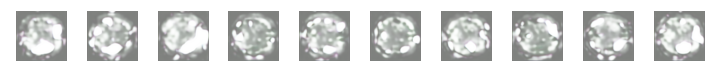

Epoch 100/500 - D Loss: 0.0135 - G Loss: 2.1824 - MSE: 0.0664 - SSIM: 0.4247


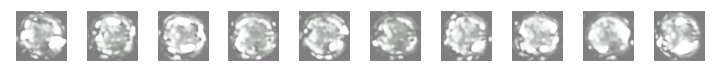

Epoch 110/500 - D Loss: 0.0045 - G Loss: 2.0703 - MSE: 0.0603 - SSIM: 0.4242


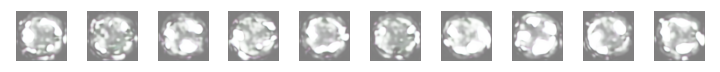

Epoch 120/500 - D Loss: 0.0015 - G Loss: 13.0101 - MSE: 0.0548 - SSIM: 0.4541


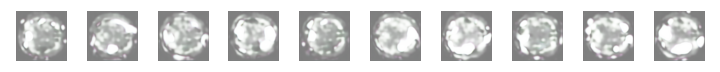

Epoch 130/500 - D Loss: 0.0132 - G Loss: 3.2710 - MSE: 0.0462 - SSIM: 0.4816


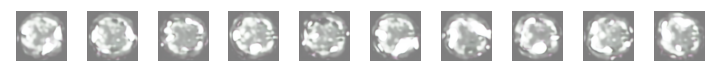

Epoch 140/500 - D Loss: 0.3406 - G Loss: 2.5721 - MSE: 0.0475 - SSIM: 0.4851


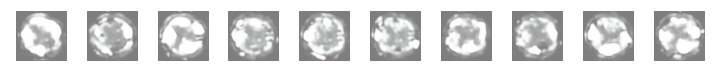

Epoch 150/500 - D Loss: 0.0907 - G Loss: 0.0895 - MSE: 0.0422 - SSIM: 0.5145


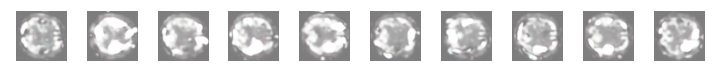

Epoch 160/500 - D Loss: 0.0001 - G Loss: 3.1184 - MSE: 0.0468 - SSIM: 0.4562


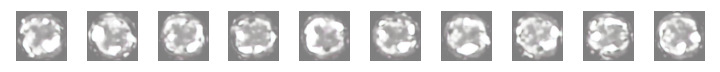

Epoch 170/500 - D Loss: 0.0064 - G Loss: 1.1395 - MSE: 0.0503 - SSIM: 0.4319


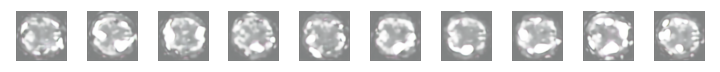

Epoch 180/500 - D Loss: 0.0000 - G Loss: 12.6084 - MSE: 0.0470 - SSIM: 0.4724


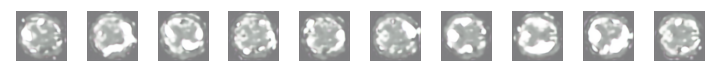

Epoch 190/500 - D Loss: 0.5649 - G Loss: 0.0062 - MSE: 0.0462 - SSIM: 0.4812


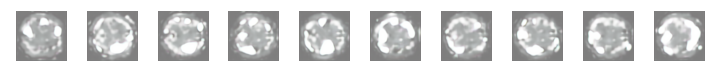

Epoch 200/500 - D Loss: 0.0043 - G Loss: 5.8042 - MSE: 0.0486 - SSIM: 0.4783


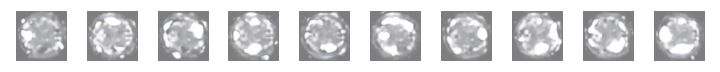

Epoch 210/500 - D Loss: 0.0307 - G Loss: 7.7415 - MSE: 0.0425 - SSIM: 0.4906


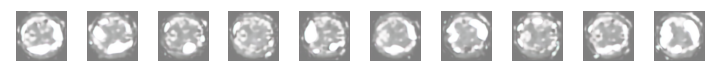

Epoch 220/500 - D Loss: 0.0439 - G Loss: 2.9292 - MSE: 0.0409 - SSIM: 0.5003


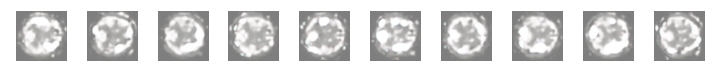

Epoch 230/500 - D Loss: 0.0003 - G Loss: 21.2578 - MSE: 0.0378 - SSIM: 0.4753


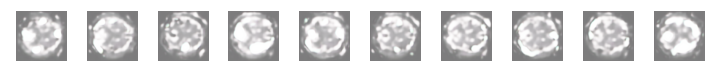

Epoch 240/500 - D Loss: 0.0683 - G Loss: 3.8591 - MSE: 0.0407 - SSIM: 0.4704


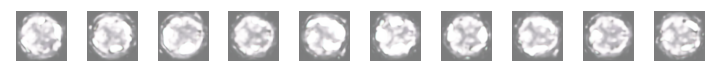

Epoch 250/500 - D Loss: 0.0481 - G Loss: 7.3551 - MSE: 0.0420 - SSIM: 0.4959


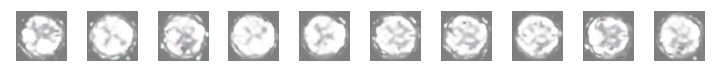

Epoch 260/500 - D Loss: 0.0068 - G Loss: 43.9092 - MSE: 0.0399 - SSIM: 0.4433


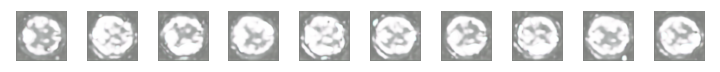

Epoch 270/500 - D Loss: 0.1377 - G Loss: 22.0927 - MSE: 0.0414 - SSIM: 0.4671


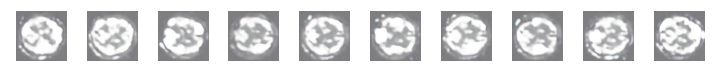

Epoch 280/500 - D Loss: 6.9322 - G Loss: 44.9015 - MSE: 0.0462 - SSIM: 0.4144


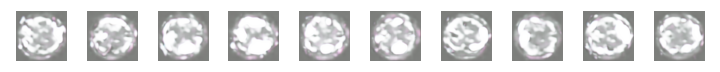

Epoch 290/500 - D Loss: 0.0000 - G Loss: 23.1385 - MSE: 0.0500 - SSIM: 0.3762


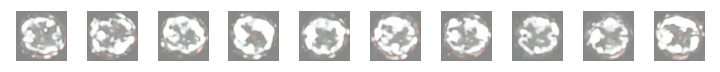

Epoch 300/500 - D Loss: 0.0001 - G Loss: 18.1370 - MSE: 0.0619 - SSIM: 0.3467


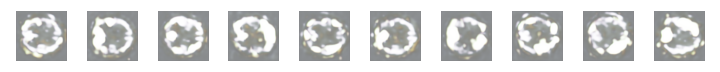

Epoch 310/500 - D Loss: 0.1094 - G Loss: 17.5834 - MSE: 0.0535 - SSIM: 0.3648


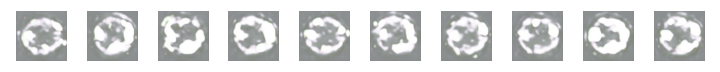

Epoch 320/500 - D Loss: 0.0031 - G Loss: 20.5493 - MSE: 0.0497 - SSIM: 0.3830


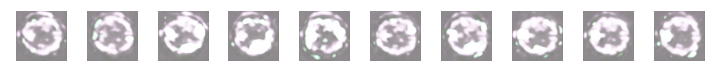

Epoch 330/500 - D Loss: 0.0046 - G Loss: 19.8387 - MSE: 0.0502 - SSIM: 0.4000


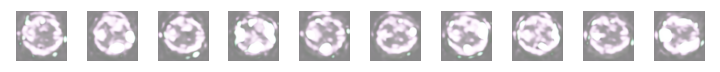

Epoch 340/500 - D Loss: 0.0010 - G Loss: 3.7926 - MSE: 0.0499 - SSIM: 0.4144


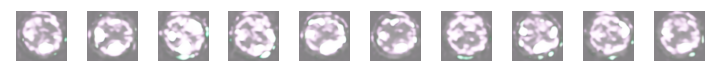

Epoch 350/500 - D Loss: 0.1641 - G Loss: 0.5248 - MSE: 0.0527 - SSIM: 0.4097


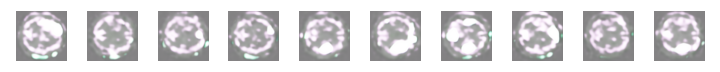

Epoch 360/500 - D Loss: 0.0042 - G Loss: 6.0540 - MSE: 0.0533 - SSIM: 0.4035


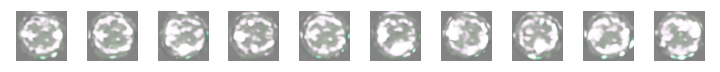

Epoch 370/500 - D Loss: 0.0010 - G Loss: 1.4849 - MSE: 0.0530 - SSIM: 0.4040


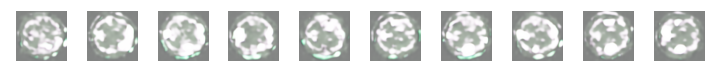

Epoch 380/500 - D Loss: 0.0005 - G Loss: 0.2086 - MSE: 0.0510 - SSIM: 0.4100


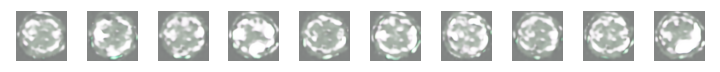

Epoch 390/500 - D Loss: 0.0022 - G Loss: 0.0918 - MSE: 0.0493 - SSIM: 0.4110


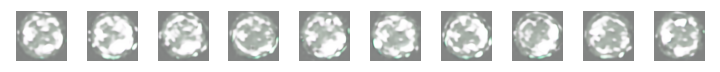

Epoch 400/500 - D Loss: 0.0067 - G Loss: 1.8193 - MSE: 0.0474 - SSIM: 0.4197


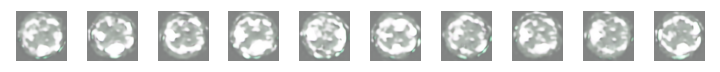

Epoch 410/500 - D Loss: 0.0014 - G Loss: 0.8407 - MSE: 0.0483 - SSIM: 0.4202


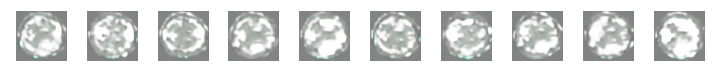

Epoch 420/500 - D Loss: 0.0007 - G Loss: 0.3448 - MSE: 0.0477 - SSIM: 0.4214


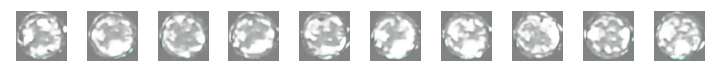

Epoch 430/500 - D Loss: 0.0117 - G Loss: 0.0286 - MSE: 0.0464 - SSIM: 0.4120


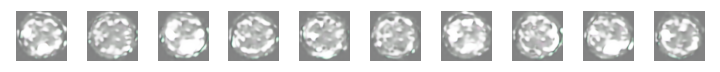

Epoch 440/500 - D Loss: 0.0119 - G Loss: 1.7217 - MSE: 0.0503 - SSIM: 0.4054


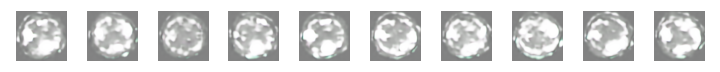

Epoch 450/500 - D Loss: 0.0981 - G Loss: 16.1088 - MSE: 0.0439 - SSIM: 0.4269


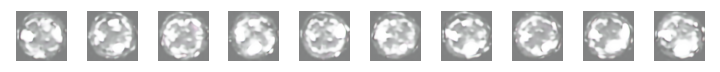

Epoch 460/500 - D Loss: 0.0075 - G Loss: 2.6461 - MSE: 0.0410 - SSIM: 0.4734


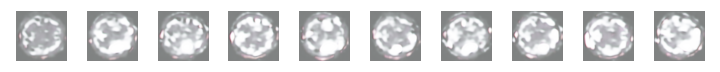

Epoch 470/500 - D Loss: 0.0001 - G Loss: 0.9459 - MSE: 0.0453 - SSIM: 0.4809


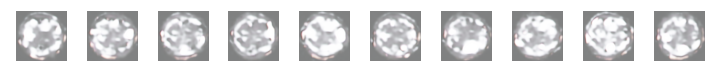

Epoch 480/500 - D Loss: 0.0000 - G Loss: 0.0016 - MSE: 0.0412 - SSIM: 0.4790


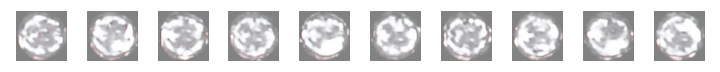

Epoch 490/500 - D Loss: 0.0009 - G Loss: 0.0175 - MSE: 0.0442 - SSIM: 0.4749


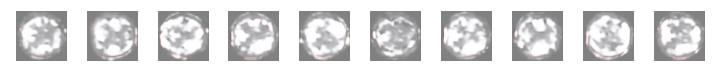

In [ ]:
history2 = train_sgan(generator, discriminator, gan, dataset=data_images, epochs=500, batch_size=32)

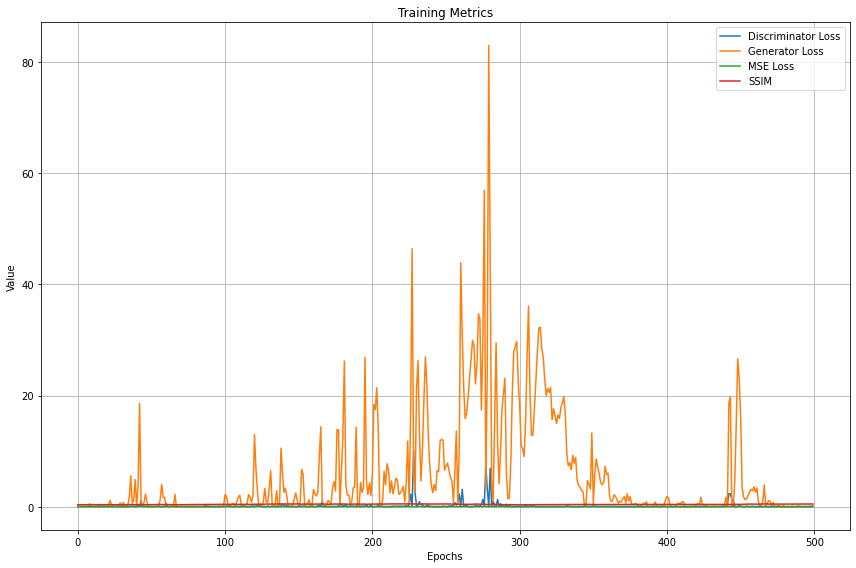

In [ ]:
import matplotlib.pyplot as plt

def plot_losses(history):
    d_losses, g_losses, mse_losses, ssim_losses = history
    epochs = range(len(d_losses))

    plt.figure(figsize=(12, 8))

    # Plot Discriminator Loss
    plt.plot(epochs, d_losses, label='Discriminator Loss')

    # Plot Generator Loss
    plt.plot(epochs, g_losses, label='Generator Loss')

    # Plot MSE Loss
    plt.plot(epochs, mse_losses, label='MSE Loss')

    # Plot SSIM
    plt.plot(epochs, ssim_losses, label='SSIM')

    plt.xlabel('Epochs')
    plt.ylabel('Value')
    plt.legend()
    plt.title('Training Metrics')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Plot the losses and metrics
plot_losses(history2)


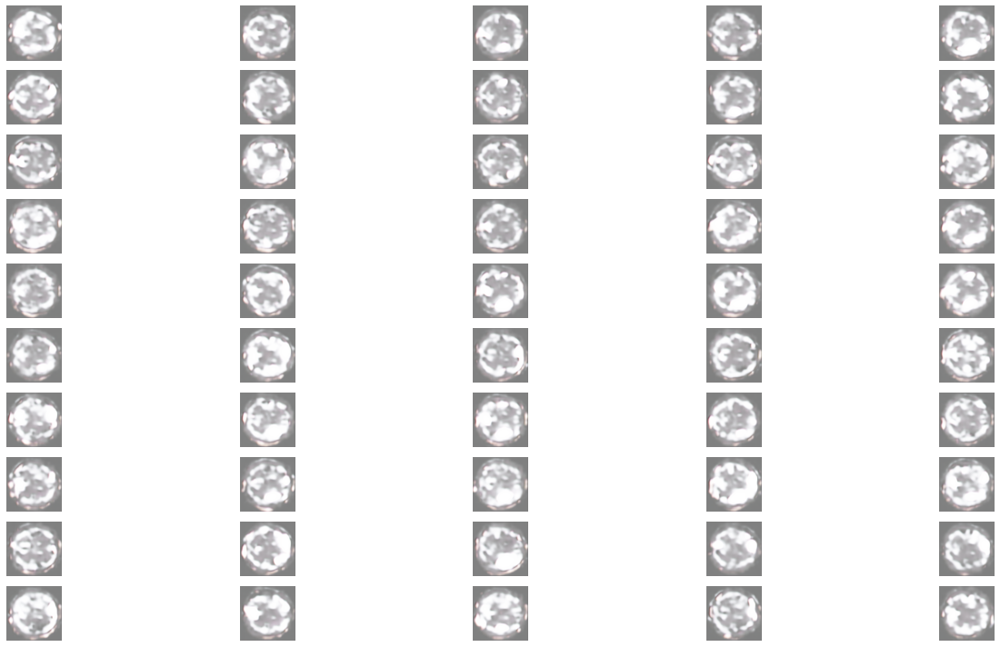

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_and_display_images(generator, latent_dim=100, num_images=50, grid_size=(10, 5)):
    # Generate random noise vectors
    noise = np.random.randn(num_images, latent_dim)

    # Generate images from noise
    generated_images = generator.predict(noise)

    # Rescale images from [-1, 1] to [0, 1] for visualization
    generated_images = (generated_images + 1) / 2.0

    # Plot generated images in a grid
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(20, 10))
    for i in range(grid_size[0]):
        for j in range(grid_size[1]):
            index = i * grid_size[1] + j
            if index < num_images:
                axes[i, j].imshow(generated_images[index])
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# Generate and display 50 images using the trained generator
generate_and_display_images(generator, latent_dim=100, num_images=50, grid_size=(10, 5))


In [ ]:
import numpy as np
import tensorflow as tf

def evaluate_model(generator, dataset, batch_size=32, latent_dim=100):
    idx = np.random.randint(0, dataset.shape[0], batch_size)
    real_imgs = dataset[idx]

    # Normalize images from [0, 255] to [-1, 1] if needed
    real_imgs = (real_imgs - 127.5) / 127.5

    # Generate fake images
    noise = np.random.randn(batch_size, latent_dim)
    fake_imgs = generator.predict(noise)

    # Normalize generated images from [-1, 1] to [0, 1]
    fake_imgs = (fake_imgs + 1) / 2.0

    # Convert to TensorFlow tensors
    real_imgs_tensor = tf.convert_to_tensor(real_imgs, dtype=tf.float32)
    fake_imgs_tensor = tf.convert_to_tensor(fake_imgs, dtype=tf.float32)

    # Calculate MSE Loss
    mse_loss = tf.reduce_mean(tf.keras.losses.MeanSquaredError()(real_imgs_tensor, fake_imgs_tensor)).numpy()

    # Calculate SSIM Loss
    ssim_loss = tf.reduce_mean(tf.image.ssim(real_imgs_tensor, fake_imgs_tensor, max_val=1.0)).numpy()

    print(f'MSE Loss: {mse_loss:.4f} - SSIM: {ssim_loss:.4f}')

    return fake_imgs, mse_loss, ssim_loss

# Example usage
fake_imgs, mse_loss, ssim_loss = evaluate_model(generator, data_images, batch_size=32, latent_dim=100)


MSE Loss: 2.9634 - SSIM: -0.5320
